# 1. Import required libraries

In [1]:
import datetime  
import pandas  as pd 
import numpy as np
import matplotlib.pyplot as plt 
import missingno as msno # Package to visualize missing values\
import seaborn as sns
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, RangeTool
from bokeh.models.widgets import Dropdown
from bokeh.io import output_notebook, curdoc,show
from bokeh.layouts import column
from bokeh.models import BooleanFilter, CDSView, Select, Range1d, HoverTool
from bokeh.palettes import Category20
from bokeh.models.formatters import NumeralTickFormatter
from bokeh.resources import INLINE
from ipywidgets import interact
%matplotlib inline
output_notebook()
import plotly.graph_objects as go
import cufflinks as cf
import mplfinance as fplt
import plotly.express as px
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.offline import plot
import ipywidgets as widgets
import plotly.graph_objs as go
init_notebook_mode(connected=True)
cf.go_offline()
import seaborn as sns

Loading BokehJS ...

# 2. Load the data using pandas method

In [2]:
stock = pd.read_csv('11_all_stocks_5yr.csv')
stock.head()

,date,open,high,low,close,volume,Name
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL


# 3. Exploring some basic information about the dataset

In [3]:
nRow, nCol = stock.shape
print(f'There are {nRow} rows and {nCol} columns')

There are 619040 rows and 7 columns


In [4]:
stock.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 619040 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    619040 non-null  object 
 1   open    619029 non-null  float64
 2   high    619032 non-null  float64
 3   low     619032 non-null  float64
 4   close   619040 non-null  float64
 5   volume  619040 non-null  int64  
 6   Name    619040 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 33.1+ MB


The dataset has totally 7 columns , 5 columns numerical type and 2 categorical features.

In our case date is a categorical datatype so we need to change it to datetime.

# 4. Check missing value

date       0
close      0
volume     0
Name       0
high       8
low        8
open      11
dtype: int64


<AxesSubplot:>

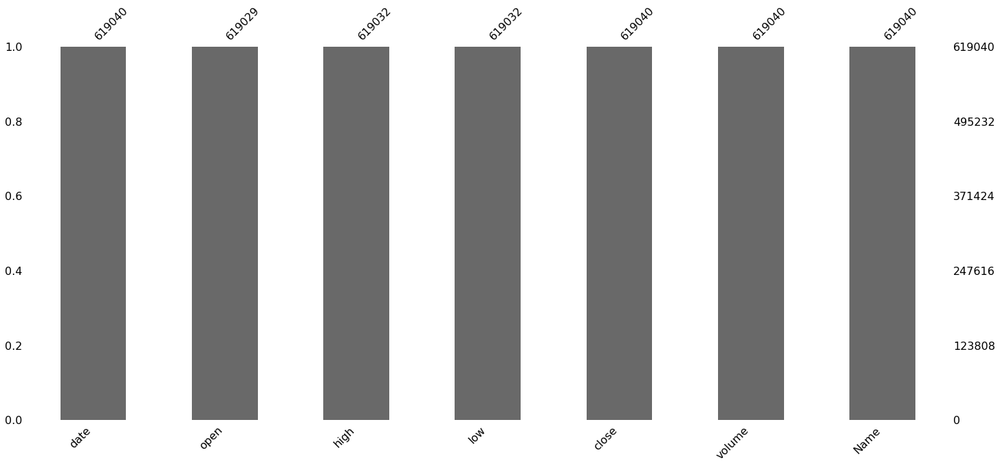

In [5]:
print(stock.isnull().sum().sort_values())
msno.bar(stock)

The number of cells missing from the dataset is negligible, it can be deleted without affecting the data set.

In [6]:
# delete mising values
stock=stock.dropna()
stock.shape

(619029, 7)

After deleting the rows containing cells with missing data, we will work with 619029 rows and 7 columns

# 5. Transform to datetime column date

In [7]:
stock['date'] = pd.to_datetime(stock['date'])
stock.info() # display date info after successful transformation 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 619029 entries, 0 to 619039
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    619029 non-null  datetime64[ns]
 1   open    619029 non-null  float64       
 2   high    619029 non-null  float64       
 3   low     619029 non-null  float64       
 4   close   619029 non-null  float64       
 5   volume  619029 non-null  int64         
 6   Name    619029 non-null  object        
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 37.8+ MB


# 6. Add comment column about status: "increase", "decrease", "equal"

In [8]:
def inc_dec(close,open):
    if close> open:
        value ="Increase"
    elif close<open:
        value="Decrease"
    else:
        value="Equal"
    return value

stock["Status"]=[inc_dec(close,open) for close, open in zip(stock.open,stock.close)]
stock

,date,open,high,low,close,volume,Name,Status
0,2013-02-08,15.07,15.12,14.63,14.75,8407500,AAL,Increase
1,2013-02-11,14.89,15.01,14.26,14.46,8882000,AAL,Increase
2,2013-02-12,14.45,14.51,14.10,14.27,8126000,AAL,Increase
3,2013-02-13,14.30,14.94,14.25,14.66,10259500,AAL,Decrease
4,2013-02-14,14.94,14.96,13.16,13.99,31879900,AAL,Increase
...,...,...,...,...,...,...,...,...
619035,2018-02-01,76.84,78.27,76.69,77.82,2982259,ZTS,Decrease
619036,2018-02-02,77.53,78.12,76.73,76.78,2595187,ZTS,Increase
619037,2018-02-05,76.64,76.92,73.18,73.83,2962031,ZTS,Increase
619038,2018-02-06,72.74,74.56,72.13,73.27,4924323,ZTS,Decrease


The goal is to easily see which day the stock price goes up and which day it's down

# 5. Pick tech stock name of the biggest companies in the US to couting statistics and visualize : Apple, Google, FaceBook, Microsoft

In [9]:
tech_stock = stock.loc[(stock["Name"].isin(["FB","AAPL","MSFT","GOOGL"]))]
tech_stock = tech_stock.set_index('date')
tech_stock

,open,high,low,close,volume,Name,Status
date,,,,,,,
2013-02-08,67.7142,68.4014,66.8928,67.8542,158168416,AAPL,Decrease
2013-02-11,68.0714,69.2771,67.6071,68.5614,129029425,AAPL,Decrease
2013-02-12,68.5014,68.9114,66.8205,66.8428,151829363,AAPL,Increase
2013-02-13,66.7442,67.6628,66.1742,66.7156,118721995,AAPL,Increase
2013-02-14,66.3599,67.3771,66.2885,66.6556,88809154,AAPL,Decrease
...,...,...,...,...,...,...,...
2018-02-01,94.7900,96.0700,93.5813,94.2600,47227882,MSFT,Increase
2018-02-02,93.6400,93.9700,91.5000,91.7800,47867753,MSFT,Increase
2018-02-05,90.5600,93.2400,88.0000,88.0000,51031465,MSFT,Increase


# 6. Couting statistics in each month, year group by name

In [10]:
stock.groupby('Name').describe()

open                                                             \
       count        mean        std      min       25%     50%      75%   
Name                                                                      
A     1259.0   49.187863   9.244798  33.1800   41.5150   46.64   56.435   
AAL   1259.0   38.390495  10.967086  13.1400   34.2050   40.93   46.565   
AAP   1259.0  132.439631  31.269628  76.0400  104.0700  141.15  156.980   
AAPL  1259.0  109.055429  30.549220  55.4242   84.6478  108.97  127.335   
ABBV  1259.0   60.802801  13.663931  35.0500   52.6800   60.04   65.720   
...      ...         ...        ...      ...       ...     ...      ...   
XYL   1259.0   41.415473  11.310076  24.2000   34.5600   37.28   49.185   
YUM   1259.0   75.422099   7.488521  59.8900   70.4350   74.11   80.380   
ZBH   1259.0  105.542014  15.060043  72.5900   96.1150  105.86  117.335   
ZION  1259.0   32.161477   7.677662  20.1000   27.4850   29.27   32.600   
ZTS   1259.0   45.091389  11.963030  28.4800   32.8000   45.61   51.485   

                high              ...     close          volume                \
         max   count        mean  ...       75%     max   count          mean   
Name                              ...                                           
A      74.48  1259.0   49.600059  ...   56.4950   74.82  1259.0  2.338039e+06   
AAL    58.79  1259.0   38.955554  ...   46.5350   58.47  1259.0  9.390321e+06   
AAP   201.24  1259.0  133.818297  ...  156.7300  200.38  1259.0  1.078043e+06   
AAPL  179.37  1259.0  109.951118  ...  127.1200  179.26  1259.0  5.404790e+07   
ABBV  121.50  1259.0   61.474133  ...   65.7450  123.21  1259.0  7.870683e+06   
...      ...     ...         ...  ...       ...     ...     ...           ...   
XYL    75.22  1259.0   41.763885  ...   49.1550   75.66  1259.0  1.183141e+06   
YUM    94.95  1259.0   76.027123  ...   80.4700   94.88  1259.0  3.209032e+06   
ZBH   132.51  1259.0  106.419854  ...  117.3150  133.09  1259.0  1.297144e+06   
ZION   54.77  1259.0   32.509290  ...   32.4625   54.98  1259.0  2.621178e+06   
ZTS    79.81  1259.0   45.488826  ...   51.2950   80.09  1259.0  3.681878e+06   

                                                                    \
               std         min         25%         50%         75%   
Name                                                                 
A     1.400161e+06    532863.0   1533017.5   2003109.0   2718401.0   
AAL   6.899305e+06   1352400.0   5696393.0   8111323.0  11188535.0   
AAP   1.019365e+06    130712.0    618201.0    849135.0   1219762.5   
AAPL  3.346835e+07  11475922.0  29694376.5  45668931.0  68708720.0   
ABBV  5.746644e+06   1747000.0   4877665.0   6707435.0   9309264.5   
...            ...         ...         ...         ...         ...   
XYL   6.490369e+05    195883.0    780197.0   1063287.0   1428822.0   
YUM   2.217774e+06    666705.0   1973342.5   2665015.0   3710812.5   
ZBH   7.703645e+05    233450.0    889572.5   1128269.0   1483897.0   
ZION  1.402907e+06    425729.0   1759095.5   2326445.0   3075903.5   
ZTS   2.965056e+06    438632.0   2251371.5   3014964.0   4233920.5   

                   
              max  
Name               
A      18146408.0  
AAL   137767165.0  
AAP    19749515.0  
AAPL  266833581.0  
ABBV  122740856.0  
...           ...  
XYL    10022418.0  
YUM    36795550.0  
ZBH    12394537.0  
ZION   15681067.0  
ZTS    39627562.0  

[505 rows x 40 columns]

In [11]:
# describe 4 companies
tech_stock.groupby('Name').describe()

open                                                               \
        count        mean         std       min       25%     50%      75%   
Name                                                                         
AAPL   1259.0  109.055429   30.549220   55.4242   84.6478  108.97  127.335   
FB     1259.0   96.455059   43.765800   22.9900   64.7200   90.59  125.785   
GOOGL  1259.0  682.357041  187.409986  384.9646  543.6600  651.57  805.960   
MSFT   1259.0   51.026394   14.859387   27.3500   40.3050   47.44   59.955   

                  high              ...    close           volume  \
           max   count        mean  ...      75%      max   count   
Name                                ...                             
AAPL    179.37  1259.0  109.951118  ...  127.120   179.26  1259.0   
FB      192.04  1259.0   97.386739  ...  126.145   193.09  1259.0   
GOOGL  1188.00  1259.0  687.362776  ...  806.400  1187.56  1259.0   
MSFT     95.14  1259.0   51.436007  ...   59.730    95.01  1259.0   

                                                                       \
               mean           std         min         25%         50%   
Name                                                                    
AAPL   5.404790e+07  3.346835e+07  11475922.0  29694376.5  45668931.0   
FB     3.435927e+07  2.672781e+07   5913066.0  17804906.5  26089163.0   
GOOGL  2.457501e+06  1.591432e+06    521141.0   1456867.0   1938260.0   
MSFT   3.386946e+07  1.958979e+07   7425603.0  22548791.0  29387581.0   

                                
              75%          max  
Name                            
AAPL   68708720.0  266833581.0  
FB     42521756.0  365380568.0  
GOOGL   3031623.5   23145371.0  
MSFT   38420244.5  248354245.0  

[4 rows x 40 columns]

In [12]:
fig = px.box(tech_stock, x="Name",y="close")
fig.show()

 After the visualization above, it can be clearly seen that there were no unusual outliers

# 7. Daily return percentage and analyzing distributions of daily return

In [13]:
tech_stock["AAPL"] = (tech_stock.loc[(tech_stock["Name"] == "AAPL")]['close'] /tech_stock.loc[(tech_stock["Name"] == "AAPL")]['close'].shift(1))-1
tech_stock["MSFT"] = (tech_stock.loc[(tech_stock["Name"] == "MSFT")]['close'] /tech_stock.loc[(tech_stock["Name"] == "MSFT")]['close'].shift(1))-1
tech_stock["FB"] = (tech_stock.loc[(tech_stock["Name"] == "FB")]['close'] /tech_stock.loc[(tech_stock["Name"] == "FB")]['close'].shift(1))-1
tech_stock["GOOGL"] = (tech_stock.loc[(tech_stock["Name"] == "GOOGL")]['close'] /tech_stock.loc[(tech_stock["Name"] == "GOOGL")]['close'].shift(1))-1

,AAPL,MSFT,FB,GOOGL
date,,,,
2013-02-08,NaN,NaN,NaN,NaN
2013-02-11,0.010422,0.011252,-0.009984,-0.003756
2013-02-12,-0.025067,0.000718,-0.031493,-0.002198
2013-02-13,-0.001903,0.005380,0.019638,0.002767
2013-02-14,-0.000899,0.000357,0.021231,0.006336


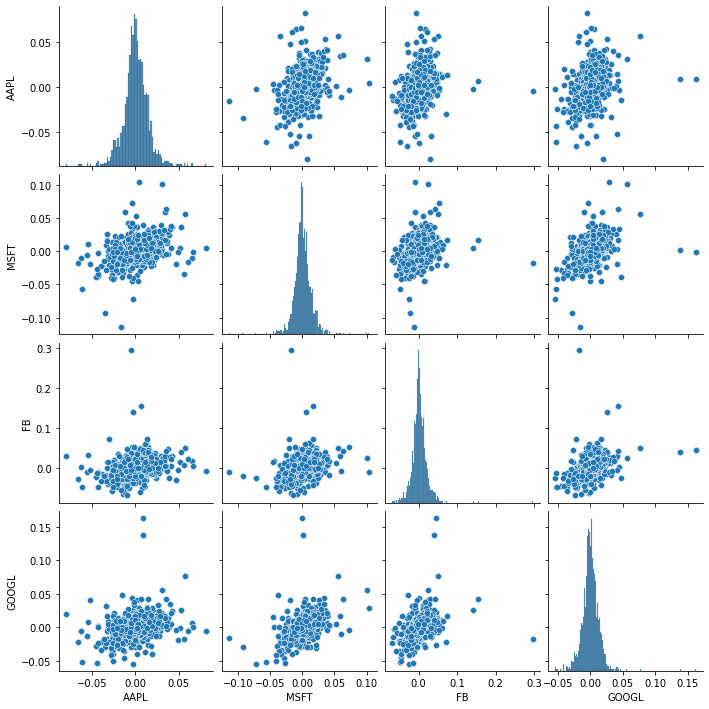

In [14]:
stocks_return = pd.concat([tech_stock["AAPL"],tech_stock["MSFT"],tech_stock["FB"],tech_stock["GOOGL"]], axis=1)
sns.pairplot(stocks_return,markers=["o", "s", "D"])
stocks_return.head()

<AxesSubplot:xlabel='date'>

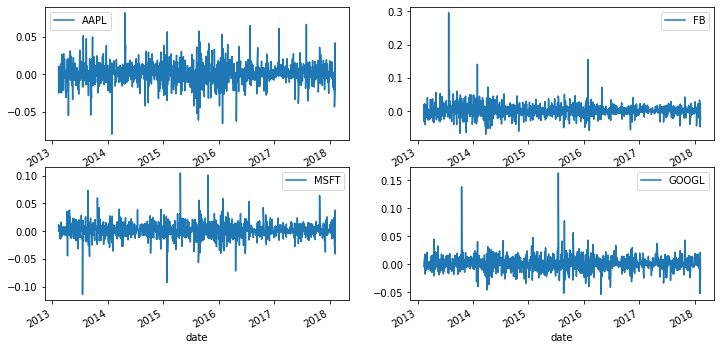

In [15]:
fig = plt.figure(figsize = (12,6))
plt.subplot(2,2,1)
stocks_return['AAPL'].plot(legend = 'AAPL')
plt.subplot(2,2,2)
stocks_return['FB'].plot(legend = 'FB')
plt.subplot(2,2,3)
stocks_return['MSFT'].plot(legend = 'MSFT')
plt.subplot(2,2,4)
stocks_return['GOOGL'].plot(legend = 'GOOGL')

In [16]:
AAPL= stock.loc[(stock["Name"].isin(["AAPL"]))]
AAPL.index=AAPL.date
GOOGL= stock.loc[(stock["Name"].isin(["GOOGL"]))]
GOOGL.index=GOOGL.date
FB= stock.loc[(stock["Name"].isin(["FB"]))]
FB.index=FB.date
MSFT= stock.loc[(stock["Name"].isin(["MSFT"]))]
MSFT.index=MSFT.date

Name
AAPL     [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
FB       [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
GOOGL    [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
MSFT     [[AxesSubplot(0.125,0.670278;0.215278x0.209722...
dtype: object

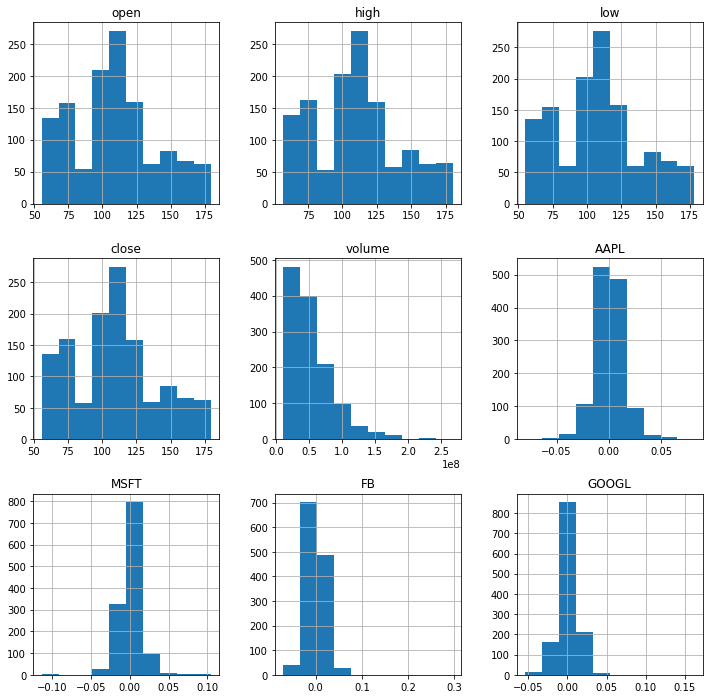

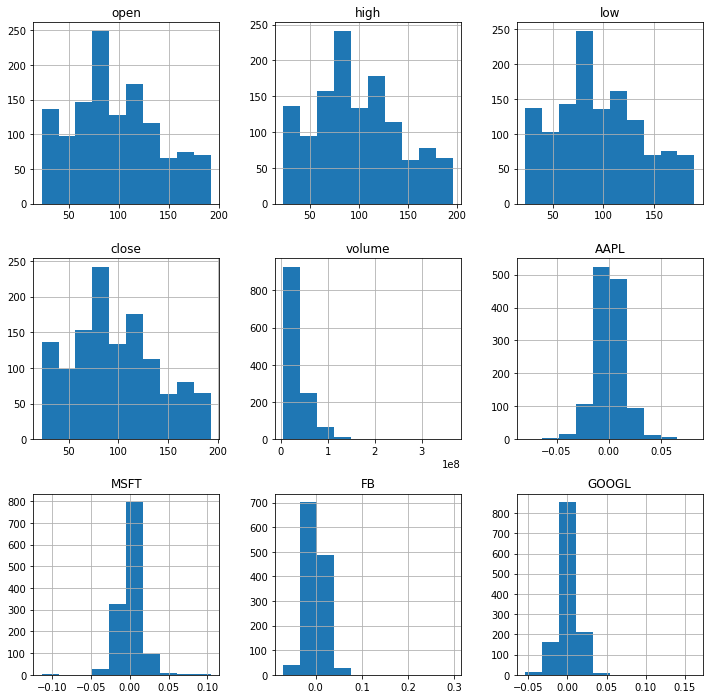

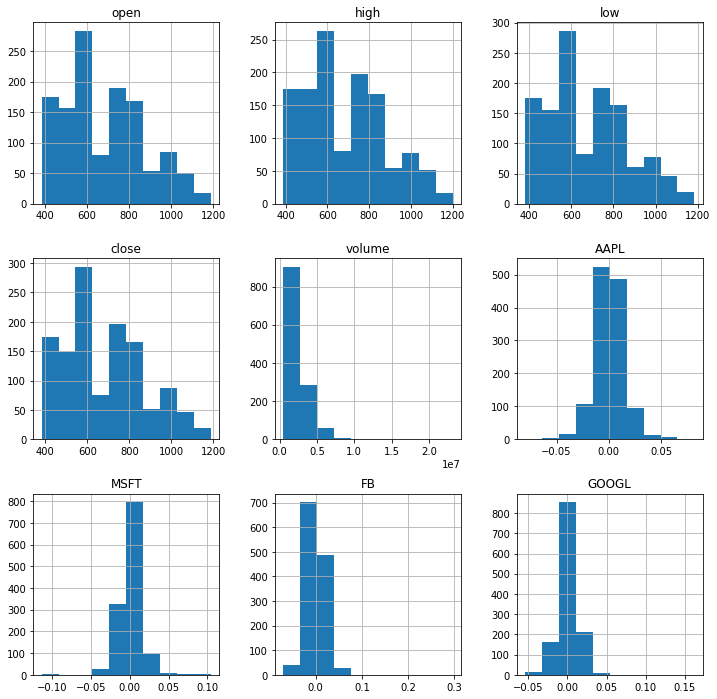

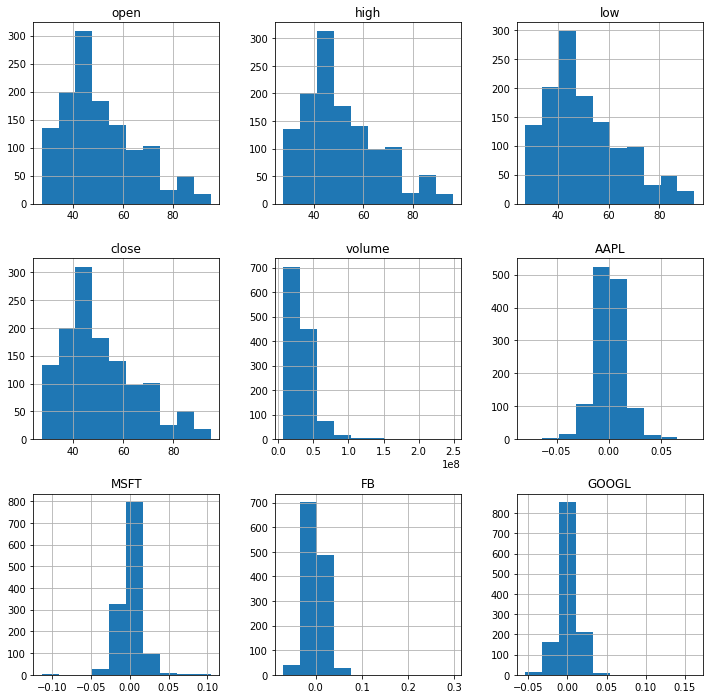

In [17]:
tech_stock.groupby("Name").hist(figsize=(12, 12))

# 8. Ploting closing prices in the years

In [18]:
'''
## Visualization of APPL stock close price in year
fig = plt.figure(figsize = (20,10))
sns.set_theme(color_codes = True)
plt.subplot(2,2,1)
color_1 = 'tab:green'
plt.title("Apple stock in years from 2013-2018")
plt.xlabel("Month",color = color_1)
plt.ylabel("close",color = color_1)
plt.plot(tech_stock.loc[(tech_stock["Name"] == "AAPL")]["close"],label = "Apple",color = color_1)
plt.legend()

### FB ###################
sns.set_theme(color_codes = True) 
plt.subplot(2,2,2)
color_2 = 'tab:blue'
plt.xlabel("Month",color = color_1)
plt.ylabel("close",color = color_1)
plt.title("Facebook in years from 2013 to 2018") 
plt.plot(tech_stock.loc[(tech_stock["Name"] == "FB")]["close"],label = "Facebook",color = color_2)
plt.legend()
#########################
sns.set_theme(color_codes = True) 
plt.subplot(2,2,3)
color_2 = 'tab:orange'
plt.xlabel("Month",color = color_1)
plt.ylabel("close",color = color_1)
plt.title("Microsoft in 2013-2018") 
plt.plot(tech_stock.loc[(tech_stock["Name"] == "MSFT")]["close"],label = "Microsoft",color = color_2)
plt.legend()
#####################################
sns.set_theme(color_codes = True)
plt.subplot(2,2,4)
color_2 = 'tab:red'
plt.xlabel("Month",color = color_1)
plt.ylabel("close",color = color_1)
plt.title("Google in 2013-2018") 
plt.plot(tech_stock.loc[(tech_stock["Name"] == "GOOGL")]["close"],label = "Goolge",color = color_2)
plt.legend()

plt.show()
'''

'\n## Visualization of APPL stock close price in year\nfig = plt.figure(figsize = (20,10))\nsns.set_theme(color_codes = True)\nplt.subplot(2,2,1)\ncolor_1 = \'tab:green\'\nplt.title("Apple stock in years from 2013-2018")\nplt.xlabel("Month",color = color_1)\nplt.ylabel("close",color = color_1)\nplt.plot(tech_stock.loc[(tech_stock["Name"] == "AAPL")]["close"],label = "Apple",color = color_1)\nplt.legend()\n\n### FB ###################\nsns.set_theme(color_codes = True) \nplt.subplot(2,2,2)\ncolor_2 = \'tab:blue\'\nplt.xlabel("Month",color = color_1)\nplt.ylabel("close",color = color_1)\nplt.title("Facebook in years from 2013 to 2018") \nplt.plot(tech_stock.loc[(tech_stock["Name"] == "FB")]["close"],label = "Facebook",color = color_2)\nplt.legend()\n#########################\nsns.set_theme(color_codes = True) \nplt.subplot(2,2,3)\ncolor_2 = \'tab:orange\'\nplt.xlabel("Month",color = color_1)\nplt.ylabel("close",color = color_1)\nplt.title("Microsoft in 2013-2018") \nplt.plot(tech_stock.l

In [19]:
# close price with menu and interactive
stocks_close = pd.DataFrame({
    'MSFT': MSFT['close'],
    'AAPL': AAPL['close'],
    'FB': FB['close'],
    'GOOGL': GOOGL['close'],
})

fig = go.Figure()

for column in stocks_close.columns.to_list():
    fig.add_trace(
        go.Scatter(
            x = stocks_close.index,
            y = stocks_close[column],
            name = column
        )
    )
    
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [dict(label = 'All',
                  method = 'update',
                  args = [{'visible': [True, True, True, True]},
                          {'title': 'All',
                           'showlegend':True}]),
             dict(label = 'MSFT',
                  method = 'update',
                  args = [{'visible': [True, False, False, False]},
                          {'title': 'MICROSOFT',
                           'showlegend':True}]),
             dict(label = 'AAPL',
                  method = 'update',
                  args = [{'visible': [False, True, False, False]},
                          {'title': 'APPLE',
                           'showlegend':True}]),
             dict(label = 'FB',
                  method = 'update',
                  args = [{'visible': [False, False, True, False]},
                          {'title': 'FACEBOOK',
                           'showlegend':True}]),
             dict(label = 'GOOGL',
                  method = 'update',
                  args = [{'visible': [False, False, False, True]},
                          {'title': 'GOOGLE',
                           'showlegend':True}]),
            ])
        )
    ])

fig.show()

The charts give information about the growth of tech companies in the us in the year of 2013. As you can see that all four figures show up the overall increase. Meanwhile Facebook witnessed the fastest growth.

# 9. Plotting volume feature.

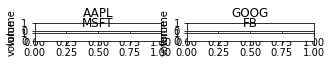

In [20]:
# Now let's plot the total volume of stock being traded each day
tech_list = ['AAPL', 'GOOG', 'MSFT', 'FB']
company_list = [AAPL, GOOGL, MSFT, FB]
company_name = ["APPLE", "GOOGLE", "MICROSOFT", "FACEBOOK"]
plt.figure(figsize=(5, 5))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(2, 2, i)
    company['volume'].iplot( kind = 'bar', color = 'red')
    plt.ylabel('volume')
    plt.xlabel(None)
    plt.title(f"{tech_list[i - 1]}")

In [21]:
# volume with menu
stocks_volume = pd.DataFrame({
    'MSFT': MSFT['volume'],
    'AAPL': AAPL['volume'],
    'FB': FB['volume'],
    'GOOGL': GOOGL['volume'],
})

fig = go.Figure()
        
for column in stocks_volume.columns.to_list():
    fig.add_trace(
        go.Bar(
            x = stocks_volume.index,
            y = stocks_volume[column],
            name = column,
            marker_color='black',
        )
    )
    
fig.update_layout(
    updatemenus=[go.layout.Updatemenu(
        active=0,
        buttons=list(
            [dict(label = 'MSFT',
                  method = 'update',
                  args = [{'visible': [True, False, False, False]}, # the index of True aligns with the indices of plot traces
                          {'title': 'MICROSOFT',
                           'showlegend':True}]),
             dict(label = 'AAPL',
                  method = 'update',
                  args = [{'visible': [False, True, False, False]},
                          {'title': 'APPLE',
                           'showlegend':True}]),
             dict(label = 'FB',
                  method = 'update',
                  args = [{'visible': [False, False, True, False]},
                          {'title': 'FACEBOOK',
                           'showlegend':True}]),
             dict(label = 'GOOGL',
                  method = 'update',
                  args = [{'visible': [False, False, False, True]},
                          {'title': 'GOOGLE',
                           'showlegend':True}]),
            ])
        )
    ])

fig.show()

Volume is one of the most important key to make trade for short term investors and traders.
Due to the size of the dataset. I just am going to plotting the apple stock. You can do the same for all stock with specific names
Volume plays an import role in technical analysis and features prominently among some keys technical indicators

# 10. Simple moving average 10, 20, 50 and 200

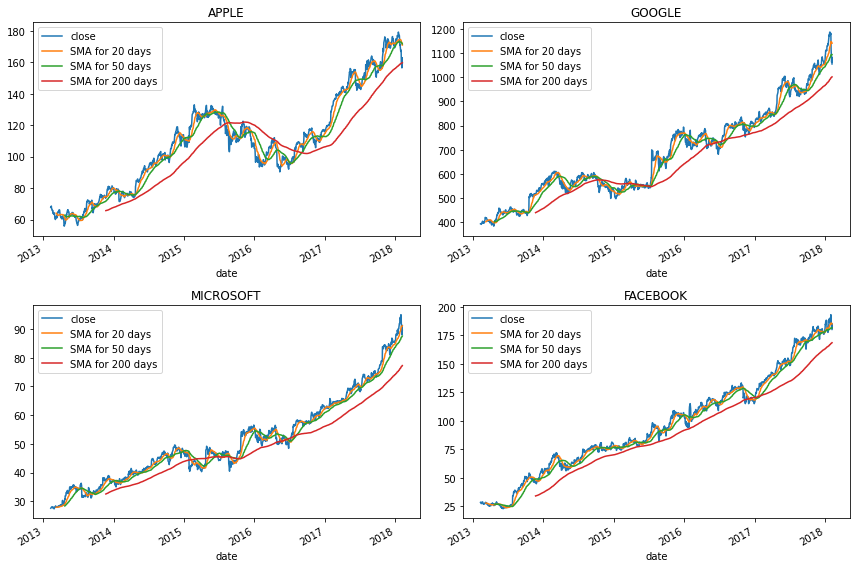

In [22]:
ma_day = [ 20, 50,200]

for ma in ma_day:
    for company in company_list:
        column_name = f"SMA for {ma} days"
        company[column_name] = company['close'].rolling(ma).mean()

fig, axes = plt.subplots(nrows=2, ncols=2)
fig.set_figheight(8)
fig.set_figwidth(12)

AAPL[['close', 'SMA for 20 days', 'SMA for 50 days','SMA for 200 days']].plot(ax=axes[0,0])
axes[0,0].set_title('APPLE')

GOOGL[['close', 'SMA for 20 days', 'SMA for 50 days','SMA for 200 days']].plot(ax=axes[0,1])
axes[0,1].set_title('GOOGLE')

MSFT[['close', 'SMA for 20 days', 'SMA for 50 days','SMA for 200 days']].plot(ax=axes[1,0])
axes[1,0].set_title('MICROSOFT')

FB[['close', 'SMA for 20 days', 'SMA for 50 days','SMA for 200 days']].plot(ax=axes[1,1])
axes[1,1].set_title('FACEBOOK')

fig.tight_layout()

Moving average is one of the most analytical tool in trading. Technical traders often use this strategy to make decision on the following trend bases on the establised trend

# 11. Bollinger band

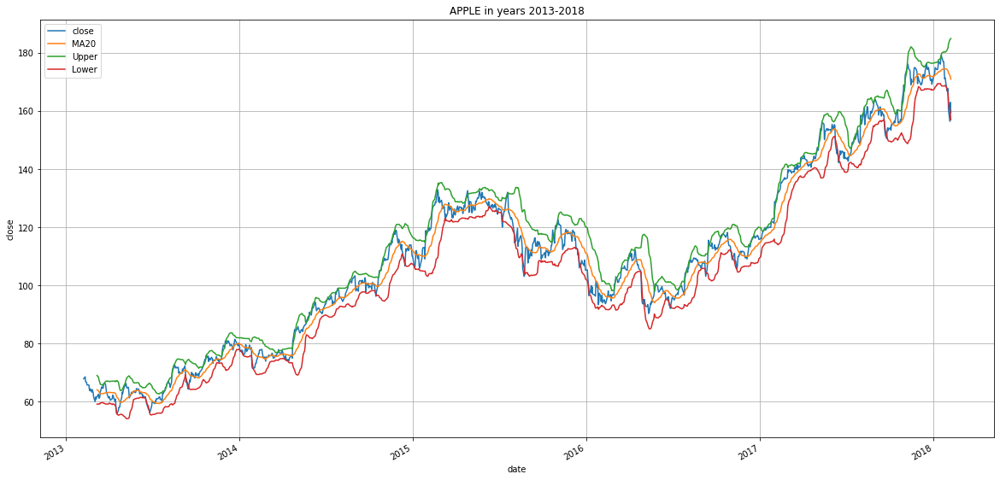

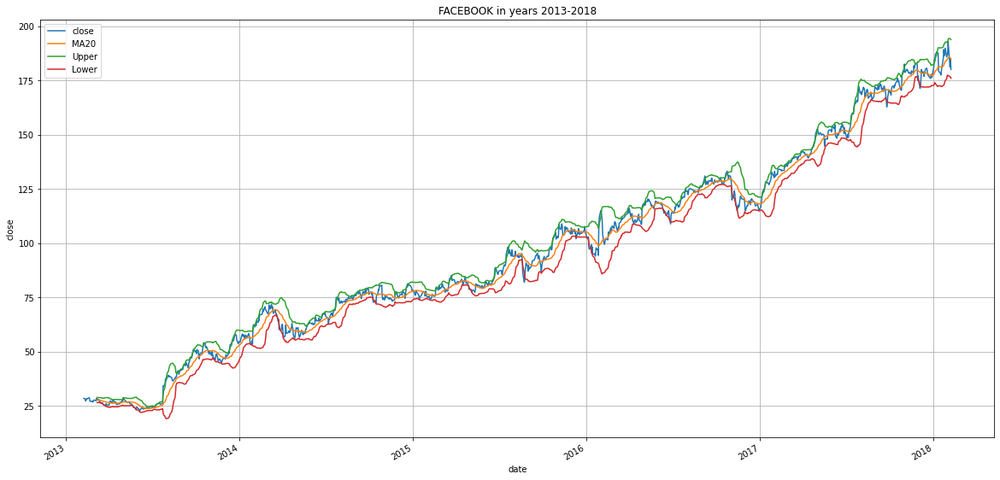

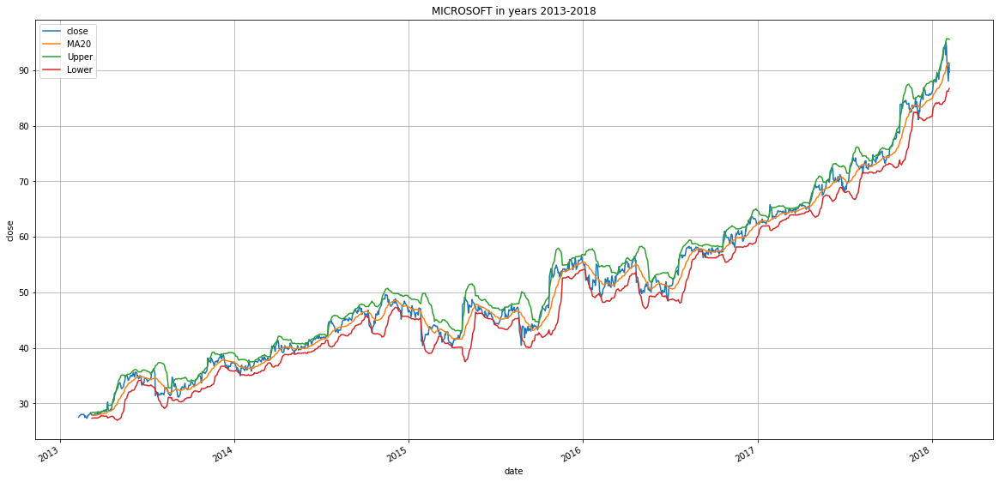

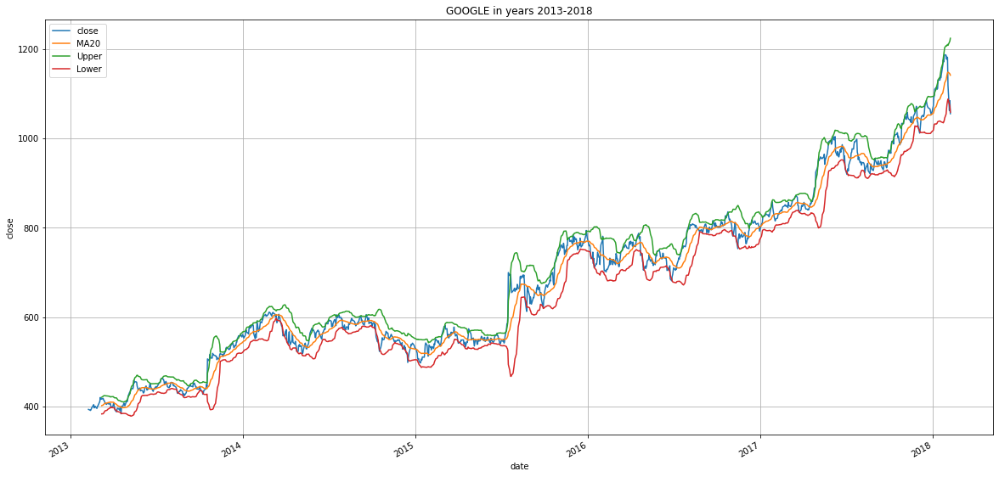

In [23]:
tech_stock['MA20'] = tech_stock.loc[(tech_stock['Name'] == "AAPL")]["close"].rolling(window = 20).mean()
tech_stock['20dSTD'] = tech_stock.loc[(tech_stock['Name'] == "AAPL")]["close"].rolling(window = 20).std()
tech_stock['Upper'] = tech_stock['MA20'] + (tech_stock['20dSTD']*2)
tech_stock['Lower'] = tech_stock['MA20'] - (tech_stock['20dSTD']*2)
aapl_bb=tech_stock.loc[(tech_stock['Name'] == "AAPL")][['close','MA20','Upper','Lower']]
aapl_bb.plot(figsize = (20,10),legend = True,title = 'APPLE in years 2013-2018')
plt.axis('tight')
plt.ylabel('close')
plt.grid(True)

tech_stock['MA20'] = tech_stock.loc[(tech_stock['Name'] == "FB")]["close"].rolling(window = 20).mean()
tech_stock['20dSTD'] = tech_stock.loc[(tech_stock['Name'] == "FB")]["close"].rolling(window = 20).std()
tech_stock['Upper'] = tech_stock['MA20'] + (tech_stock['20dSTD']*2)
tech_stock['Lower'] = tech_stock['MA20'] - (tech_stock['20dSTD']*2)
tech_stock.loc[(tech_stock['Name'] == "FB")][['close','MA20','Upper','Lower']].plot(figsize = (20,10),legend = True,title = 'FACEBOOK in years 2013-2018')
plt.axis('tight')
plt.ylabel('close')
plt.grid(True)

tech_stock['MA20'] = tech_stock.loc[(tech_stock['Name'] == "MSFT")]["close"].rolling(window = 20).mean()
tech_stock['20dSTD'] = tech_stock.loc[(tech_stock['Name'] == "MSFT")]["close"].rolling(window = 20).std()
tech_stock['Upper'] = tech_stock['MA20'] + (tech_stock['20dSTD']*2)
tech_stock['Lower'] = tech_stock['MA20'] - (tech_stock['20dSTD']*2)
tech_stock.loc[(tech_stock['Name'] == "MSFT")][['close','MA20','Upper','Lower']].plot(figsize = (20,10),legend = True,title = 'MICROSOFT in years 2013-2018')
plt.axis('tight')
plt.ylabel('close')
plt.grid(True)

tech_stock['MA20'] = tech_stock.loc[(tech_stock['Name'] == "GOOGL")]["close"].rolling(window = 20).mean()
tech_stock['20dSTD'] = tech_stock.loc[(tech_stock['Name'] == "GOOGL")]["close"].rolling(window = 20).std()
tech_stock['Upper'] = tech_stock['MA20'] + (tech_stock['20dSTD']*2)
tech_stock['Lower'] = tech_stock['MA20'] - (tech_stock['20dSTD']*2)
tech_stock.loc[(tech_stock['Name'] == "GOOGL")][['close','MA20','Upper','Lower']].plot(figsize = (20,10),legend = True,title = 'GOOGLE in years 2013-2018')
plt.axis('tight')
plt.ylabel('close')
plt.grid(True)


- Bollinger band shows the volatility of stock prices, the ability to reverse potential in a specific time period.
- Microsoft stock trading volume increased and decreased quite dramatically.

# 12. Candle Sticks

In [24]:
INCREASING_COLOR = 'green'
DECREASING_COLOR = 'red'
############
comp=GOOGL
data = [ dict(
    type = 'candlestick',
    x = comp.index, 
    open = comp["open"],
    close =comp["close"],
    low = comp["low"], 
    high = comp["high"],
    yaxis = 'y2',
    name = 'GS',
    increasing = dict( line = dict( color = INCREASING_COLOR ) ),
    decreasing = dict( line = dict( color = DECREASING_COLOR ) ),
) ]

In [25]:
layout=dict()
fig = dict( data=data, layout=layout )
fig['layout'] = dict()
fig['layout']['plot_bgcolor'] = 'rgb(250, 250,250)'
fig['layout']['xaxis'] = dict( rangeselector = dict( visible = True ) )
fig['layout']['yaxis'] = dict( domain = [0, 0.2], showticklabels = False )
fig['layout']['yaxis2'] = dict( domain = [0.2, 0.8] )
fig['layout']['legend'] = dict( orientation = 'h', y=0.9, x=0.3, yanchor='bottom' )
fig['layout']['margin'] = dict( t=40, b=40, r=40, l=40 )


In [26]:
rangeselector=dict(
    visibe = True,
    x = 0, y = 0.9,
    bgcolor = 'rgba(250, 200, 250, 0.4)',
    font = dict( size = 13 ),
    buttons=list([
        dict(count=1,
             label='reset',
             step='all'),
        dict(count=1,
             label='1yr',
             step='year',
             stepmode='backward'),
        dict(count=3,
            label='3 mo',
            step='month',
            stepmode='backward'),
        dict(count=1,
            label='1 mo',
            step='month',
            stepmode='backward'),
        dict(step='all')
    ]))

In [27]:
fig['layout']['xaxis']['rangeselector'] = rangeselector
def movingaverage(interval, window_size=10):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(interval, window, 'same')
mv_y = movingaverage(comp["close"])
mv_x = list(comp.index)

# Clip the ends
mv_x = mv_x[5:-5]
mv_y = mv_y[5:-5]

fig['data'].append( dict( x=mv_x, y=mv_y, type='scatter', mode='lines', 
                         line = dict( width = 1 ),
                         marker = dict( color = 'orange' ),
                         yaxis = 'y2', name='Moving Average' ) )

In [28]:
# set volume bar chart colors
colors = []
for i in range(1,len(comp.close)):
    if i != 0:
        if comp.close[i] > comp.close[i-1]:
            colors.append(INCREASING_COLOR)
        else:
            colors.append(DECREASING_COLOR)
    else:
        colors.append(DECREASING_COLOR)
        
# add volume bar chart
fig['data'].append( dict( x=comp.index, y=comp.volume,                         
                         marker=dict( color=colors ),
                         type='bar', yaxis='y', name='Volume' ) )

In [29]:
def bbands(price, window_size=10, num_of_std=5):
    rolling_mean = price.rolling(window=window_size).mean()
    rolling_std  = price.rolling(window=window_size).std()
    upper_band = rolling_mean + (rolling_std*num_of_std)
    lower_band = rolling_mean - (rolling_std*num_of_std)
    return rolling_mean, upper_band, lower_band

In [30]:
import plotly.graph_objs as go
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
import plotly

In [31]:
bb_avg, bb_upper, bb_lower = bbands(comp.close)
fig['data'].append( dict( x=comp.index, y=bb_upper, type='scatter', yaxis='y2', 
                         line = dict( width = 1 ),
                         marker=dict(color='#ccc'), hoverinfo='none', 
                         legendgroup='Bollinger Bands', name='Bollinger Bands') )

fig['data'].append( dict( x=comp.index, y=bb_lower, type='scatter', yaxis='y2',
                         line = dict( width = 1 ),
                         marker=dict(color='#ccc'), hoverinfo='none',
                         legendgroup='Bollinger Bands', showlegend=False ) )
plotly.offline.init_notebook_mode()
plotly.offline.iplot(fig,filename = 'candlestick-test-3',validate = False )

- Facebook's stock price trend has grown well. Between June 2013 and January 2014, this is the period when stocks rose sharply, we observe that with the Bollinger Bands and volume volume.